In [1]:
import pandas as pd

In [2]:
df=pd.read_csv('/content/drive/MyDrive/US Police shootings in from 2015-22.csv')

In [3]:
df.columns

Index(['id', 'name', 'date', 'manner_of_death', 'armed', 'age', 'gender',
       'race', 'city', 'state', 'signs_of_mental_illness', 'threat_level',
       'flee', 'body_camera', 'longitude', 'latitude', 'is_geocoding_exact'],
      dtype='object')

In [4]:
df.head(10)

,id,name,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,is_geocoding_exact
0,1,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,Shelton,WA,True,attack,Not fleeing,False,-123.122,47.247,True
1,2,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,Aloha,OR,False,attack,Not fleeing,False,-122.892,45.487,True
2,3,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,Wichita,KS,False,other,Not fleeing,False,-97.281,37.695,True
3,4,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,San Francisco,CA,True,attack,Not fleeing,False,-122.422,37.763,True
4,5,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,Evans,CO,False,attack,Not fleeing,False,-104.692,40.384,True
5,6,Kenneth Joe Brown,2015-01-04,shot,gun,18.0,M,W,Guthrie,OK,False,attack,Not fleeing,False,-97.423,35.877,True
6,7,Kenneth Arnold Buck,2015-01-05,shot,gun,22.0,M,H,Chandler,AZ,False,attack,Car,False,-111.841,33.328,True
7,8,Brock Nichols,2015-01-06,shot,gun,35.0,M,W,Assaria,KS,False,attack,Not fleeing,False,-97.564,38.704,True
8,9,Autumn Steele,2015-01-06,shot,unarmed,34.0,F,W,Burlington,IA,False,other,Not fleeing,True,-91.119,40.809,True
9,10,Leslie Sapp III,2015-01-06,shot,toy weapon,47.0,M,B,Knoxville,PA,False,attack,Not fleeing,False,-79.991,40.413,True


In [6]:
# Convert the 'date' column to datetime format
df['date'] = pd.to_datetime(df['date'])
#Removing year 2022 from data frame, as we only have parital data avaialable in it.
df = df[df['date'].dt.year != 2022]

In [7]:
df['date'].dt.year.unique()

array([2015, 2016, 2017, 2018, 2019, 2020, 2021])

In [8]:
df.count()

id                         6999
name                       6696
date                       6999
manner_of_death            6999
armed                      6792
age                        6637
gender                     6995
race                       6031
city                       6999
state                      6999
signs_of_mental_illness    6999
threat_level               6999
flee                       6423
body_camera                6999
longitude                  6417
latitude                   6417
is_geocoding_exact         6999
dtype: int64

In [9]:
#Checking the number of null values for each attribute
df.isnull().sum()

id                           0
name                       303
date                         0
manner_of_death              0
armed                      207
age                        362
gender                       4
race                       968
city                         0
state                        0
signs_of_mental_illness      0
threat_level                 0
flee                       576
body_camera                  0
longitude                  582
latitude                   582
is_geocoding_exact           0
dtype: int64

In [10]:
#Since the names cannot be null and we just can't give some random values for unknown names, so I'll just assign John Doe name
df['name'] = df['name'].fillna('John Doe')

In [11]:
#Checking the count of names with null values post processesing
df['name'].isnull().sum()

0

In [12]:
#Number of unique arms reported in the incidents
df['armed'].nunique()

97

In [13]:
#Number of races of the targeted victims reported
df['race'].unique()

array(['A', 'W', 'H', 'B', 'O', nan, 'N'], dtype=object)

In [14]:
df['race'].fillna('Other', inplace=True)

In [15]:
df['race'].describe()

count     6999
unique       7
top          W
freq      3071
Name: race, dtype: object

In [16]:
df['city'].mode()

0    Los Angeles
Name: city, dtype: object

In [17]:
df['city'].value_counts()

Los Angeles    115
Phoenix         95
Houston         75
San Antonio     63
Las Vegas       60
              ... 
Wenatchee        1
Avenal           1
Paulden          1
Neosho           1
Algona           1
Name: city, Length: 2951, dtype: int64

In [18]:
#Unique states in which the incidents are reported
df['state'].nunique()

51

In [19]:
state_count_info = df['state'].value_counts()
state_count_list = [list(info) for info in zip(state_count_info.values, state_count_info.index)]
print(state_count_list)

[[1028, 'CA'], [620, 'TX'], [450, 'FL'], [313, 'AZ'], [257, 'GA'], [256, 'CO'], [197, 'NC'], [197, 'OK'], [194, 'OH'], [190, 'TN'], [184, 'WA'], [182, 'MO'], [144, 'PA'], [143, 'NM'], [142, 'LA'], [140, 'IL'], [133, 'IN'], [130, 'AL'], [129, 'NY'], [129, 'KY'], [121, 'VA'], [117, 'NV'], [116, 'MI'], [112, 'WI'], [109, 'OR'], [108, 'SC'], [100, 'MD'], [97, 'AR'], [93, 'MS'], [84, 'UT'], [82, 'NJ'], [79, 'MN'], [65, 'WV'], [65, 'KS'], [58, 'ID'], [49, 'MA'], [49, 'AK'], [44, 'MT'], [44, 'IA'], [37, 'HI'], [36, 'NE'], [29, 'ME'], [22, 'CT'], [21, 'SD'], [21, 'DC'], [18, 'NH'], [18, 'WY'], [16, 'DE'], [15, 'ND'], [11, 'VT'], [5, 'RI']]


In [20]:
state_count_list.sort(reverse=True)

In [21]:
print(state_count_list)

[[1028, 'CA'], [620, 'TX'], [450, 'FL'], [313, 'AZ'], [257, 'GA'], [256, 'CO'], [197, 'OK'], [197, 'NC'], [194, 'OH'], [190, 'TN'], [184, 'WA'], [182, 'MO'], [144, 'PA'], [143, 'NM'], [142, 'LA'], [140, 'IL'], [133, 'IN'], [130, 'AL'], [129, 'NY'], [129, 'KY'], [121, 'VA'], [117, 'NV'], [116, 'MI'], [112, 'WI'], [109, 'OR'], [108, 'SC'], [100, 'MD'], [97, 'AR'], [93, 'MS'], [84, 'UT'], [82, 'NJ'], [79, 'MN'], [65, 'WV'], [65, 'KS'], [58, 'ID'], [49, 'MA'], [49, 'AK'], [44, 'MT'], [44, 'IA'], [37, 'HI'], [36, 'NE'], [29, 'ME'], [22, 'CT'], [21, 'SD'], [21, 'DC'], [18, 'WY'], [18, 'NH'], [16, 'DE'], [15, 'ND'], [11, 'VT'], [5, 'RI']]


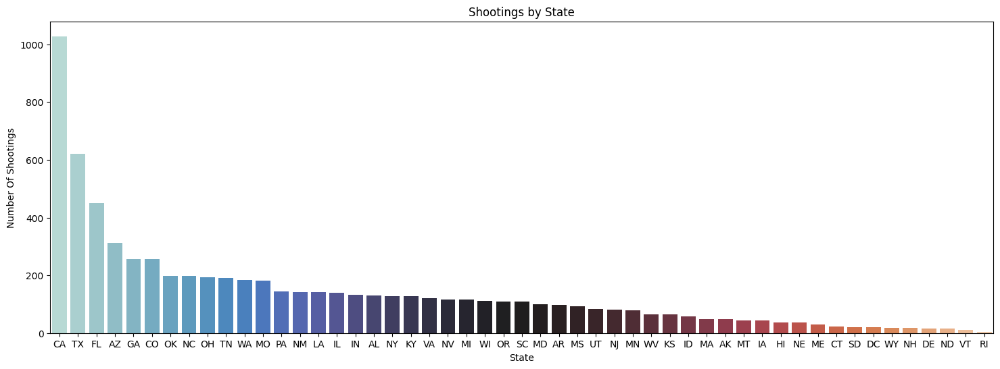

In [22]:
# a plot for states vs number of incidents is plotted here
import seaborn as sns
import matplotlib.pyplot as plt

x = [i[1] for i in state_count_list]
y = [i[0] for i in state_count_list]

plt.figure(figsize=(18,6))
sns.barplot(x=x,y=y,palette='icefire')
plt.xlabel(xlabel = 'State')
plt.ylabel(ylabel = 'Number Of Shootings')
plt.title(label = 'Shootings by State')
plt.show()

The above graph depicts that the incidents in California are highest, followed by Texas

In [28]:
data = df.dropna(subset=['latitude', 'longitude'])
data = data[data['is_geocoding_exact'] == True]

In [29]:
import folium

# Assuming 'dataframe' is your DataFrame

# Calculate the center of the map based on the mean latitude and longitude
center_lat = data['latitude'].mean()
center_lon = data['longitude'].mean()

# Create a Folium map centered at the calculated location
m = folium.Map(location=[center_lat, center_lon], zoom_start=5)  # Adjust zoom level as needed

# Loop through the DataFrame and add each shooting incident as a marker
for index, row in data.iterrows():
    # Construct details for the popup
    details = (f"Name: {row['name']} | Date: {row['date']} | Manner of Death: {row['manner_of_death']} | "
               f"Armed: {row['armed']} | Age: {row['age']} | Gender: {row['gender']} | Race: {row['race']} | "
               f"Signs of Mental Illness: {row['signs_of_mental_illness']} | "
               )

    # Add a marker to the map
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=details,
        icon=folium.Icon(color='red', icon='info-sign')  # You can choose different colors or icons
    ).add_to(m)

# Display the map
m

<ipython-input-30-44f133a8ae0c>:2: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=data['longitude'], y=data['latitude'], cmap="Reds", shade=True, bw_adjust=0.5)


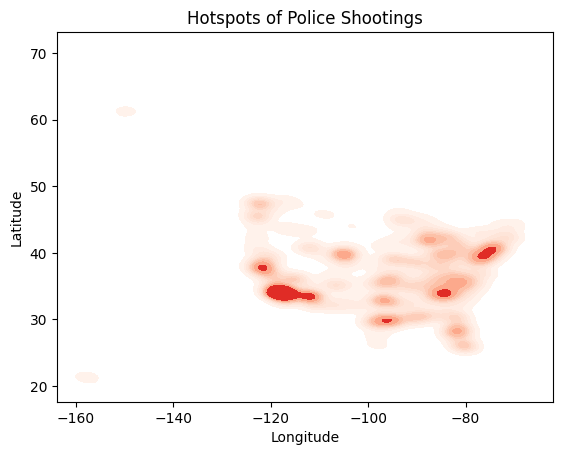

In [30]:
# You may need to adjust the bandwidth depending on your specific dataset
sns.kdeplot(x=data['longitude'], y=data['latitude'], cmap="Reds", shade=True, bw_adjust=0.5)

plt.title('Hotspots of Police Shootings')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

### Distribution of Age

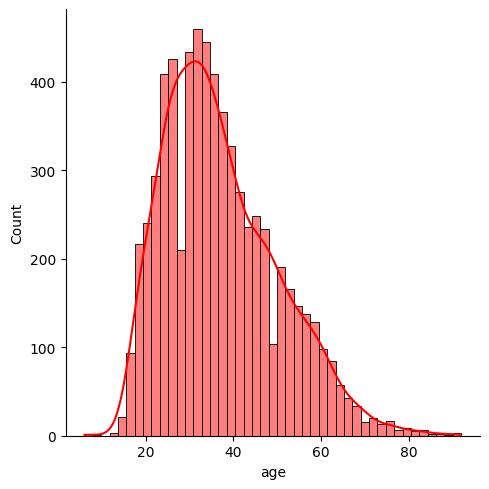

In [23]:
#Age distibution of the victims reported

sns.displot(df['age'],kde=True,color='r')

In [24]:
#Replacing missing values in the 'age' column with the mean value of the non-missing values

df['age'] = df['age'].fillna(df['age'].mean())

In [25]:
import numpy as np

#Adding column Age Group of the person based on the grouping as defined below

conditions = [
    (df['age'] <= 18),
    (df['age'] > 18) & (df['age'] <= 40),
    (df['age'] > 40) & (df['age'] <= 60),
    (df['age'] > 60)
    ]

# create a list of the values we want to assign for each condition
values = ['Age less than 18', 'Age between 18 and 40', 'Age between 40 and 60', 'Age greater than 60']

# create a new column and use np.select to assign values to it using our lists as arguments
df['Age_group_of_the_Person'] = np.select(conditions, values)

# display updated DataFrame
df.head()

,id,name,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,is_geocoding_exact,Age_group_of_the_Person
0,1,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,Shelton,WA,True,attack,Not fleeing,False,-123.122,47.247,True,Age between 40 and 60
1,2,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,Aloha,OR,False,attack,Not fleeing,False,-122.892,45.487,True,Age between 40 and 60
2,3,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,Wichita,KS,False,other,Not fleeing,False,-97.281,37.695,True,Age between 18 and 40
3,4,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,San Francisco,CA,True,attack,Not fleeing,False,-122.422,37.763,True,Age between 18 and 40
4,5,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,Evans,CO,False,attack,Not fleeing,False,-104.692,40.384,True,Age between 18 and 40


In [26]:
df['Age_group_of_the_Person'].value_counts()

Age between 18 and 40    4480
Age between 40 and 60    1917
Age greater than 60       367
Age less than 18          235
Name: Age_group_of_the_Person, dtype: int64

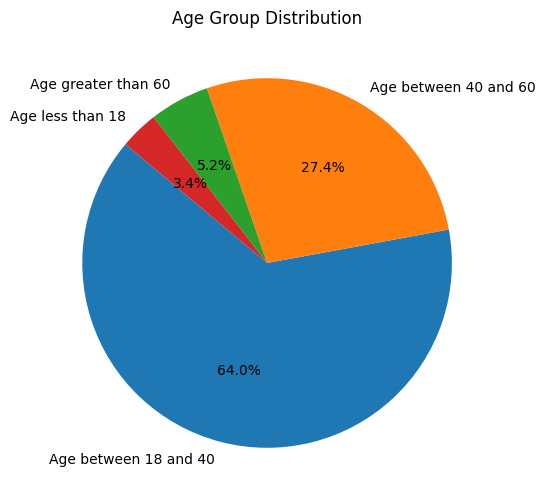

In [27]:
age_group_counts = df['Age_group_of_the_Person'].value_counts()

# Labels for the pie chart
labels = age_group_counts.index

# Values for each slice of the pie chart
sizes = age_group_counts.values

# Plotting the pie chart
plt.figure(figsize=(6, 6))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140)
plt.title('Age Group Distribution')
plt.show()

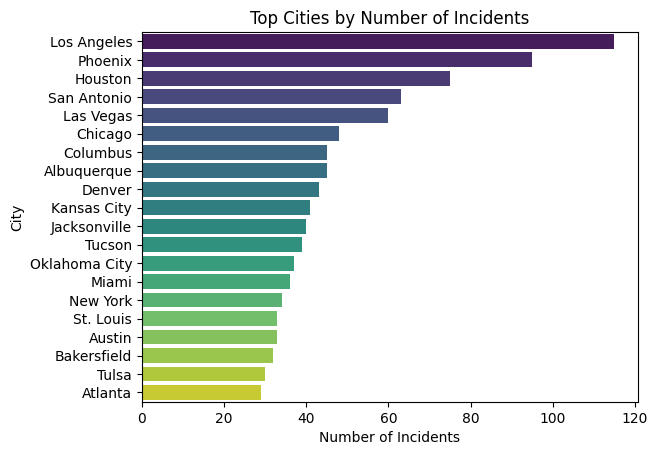

In [31]:
# Number of incidents vs the city the incident occured

incident_counts = df['city'].value_counts().reset_index(name='incident_count')

# Selecting the top 20 cities by incident count
top_cities = incident_counts.head(20)

sns.barplot(x='incident_count', y='index', data=top_cities, palette='viridis')
plt.xlabel('Number of Incidents')
plt.ylabel('City')
plt.title('Top Cities by Number of Incidents')
plt.show()


In [32]:
df.columns

Index(['id', 'name', 'date', 'manner_of_death', 'armed', 'age', 'gender',
       'race', 'city', 'state', 'signs_of_mental_illness', 'threat_level',
       'flee', 'body_camera', 'longitude', 'latitude', 'is_geocoding_exact',
       'Age_group_of_the_Person'],
      dtype='object')

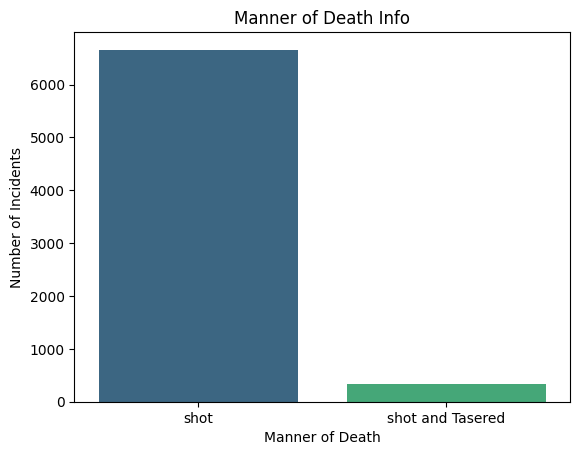

In [33]:
#Plotting manner of death reported
manner_of_death_counts = df['manner_of_death'].value_counts().reset_index(name='incident_count')
x = manner_of_death_counts['index']
y = manner_of_death_counts['incident_count']
sns.barplot(x=x, y=y, palette='viridis')

plt.ylabel('Number of Incidents')
plt.xlabel('Manner of Death')
plt.title('Manner of Death Info')
plt.show()


## Male vs Female

<ipython-input-34-5de26a0f1983>:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_male, hist=False, rug=True,color='red')
<ipython-input-34-5de26a0f1983>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_female, hist=False, rug=True,color='green')


<Axes: ylabel='Density'>

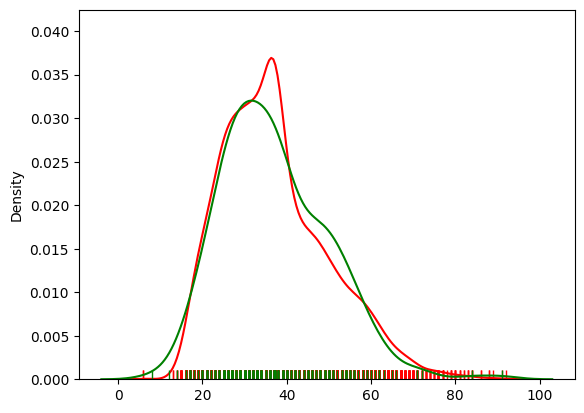

In [34]:
df_male=df[df['gender']=='M']['age'].values
df_female=df[df['gender']=='F']['age'].values


sns.distplot(df_male, hist=False, rug=True,color='red')
sns.distplot(df_female, hist=False, rug=True,color='green')

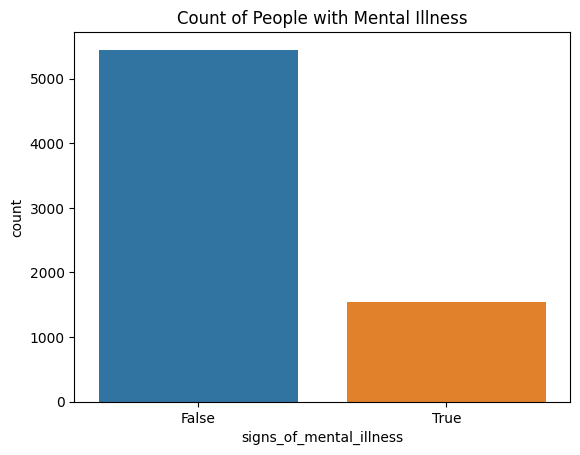

In [35]:
sns.countplot(data=df,x='signs_of_mental_illness')
plt.title("Count of People with Mental Illness")
plt.show()

The above data specifies that most of the victims did not have mental illness

# Was the victim fleeing?

In [36]:
df['flee'].isna().sum()

576

In [37]:
df['flee'] = df['flee'].fillna('unknown')

<Axes: >

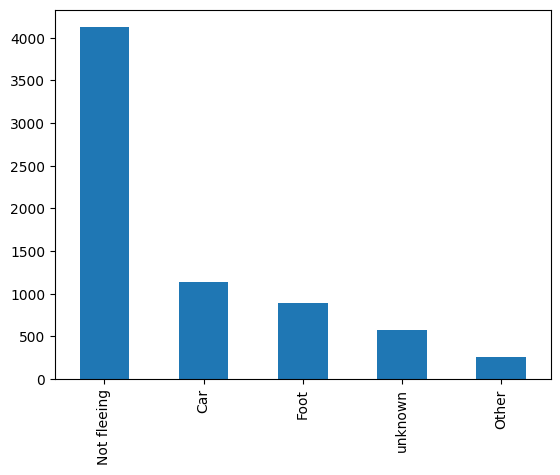

In [38]:
df['flee'].value_counts().plot(kind='bar')

Data suggests majority of the victims didnot flee from the incident site

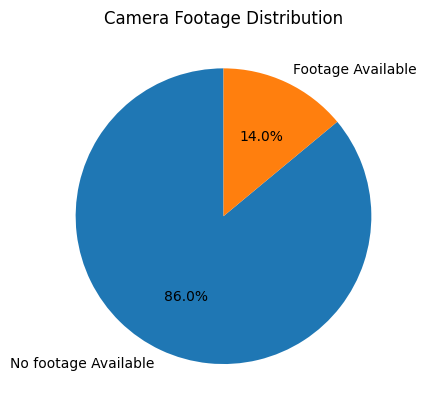

In [39]:
body_camera_counts = df['body_camera'].value_counts()

x = ['No footage Available', 'Footage Available']
y = body_camera_counts.values

plt.pie(y, labels=x, autopct='%1.1f%%', startangle=90)
plt.title('Camera Footage Distribution')
plt.show()

Most of the incidents happend when the Body Cam is OFF/ Not Available.

# *Yearly, Monthly and Seasonal Trends*

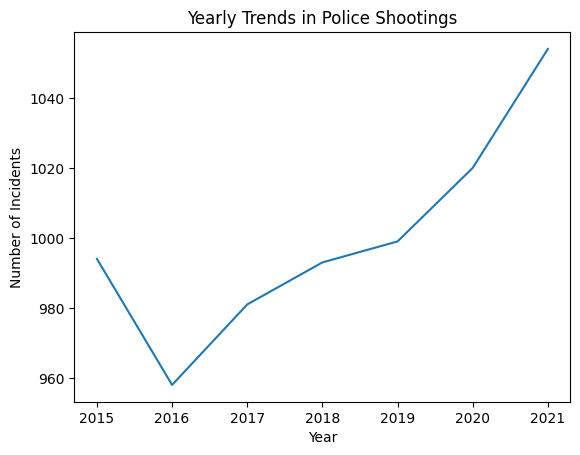

In [40]:
yearly_data = df.groupby(df['date'].dt.year).size()

# Plot the data
yearly_data.plot(kind='line', title='Yearly Trends in Police Shootings')
plt.xlabel('Year')
plt.ylabel('Number of Incidents')
plt.show()

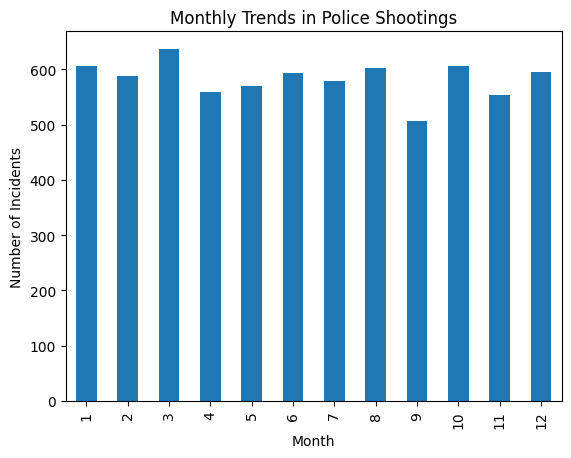

In [41]:
# Group by month (across all years)
monthly_data = df.groupby(df['date'].dt.month).size()

# Plot the data
monthly_data.plot(kind='bar', title='Monthly Trends in Police Shootings')
plt.xlabel('Month')
plt.ylabel('Number of Incidents')
plt.show()

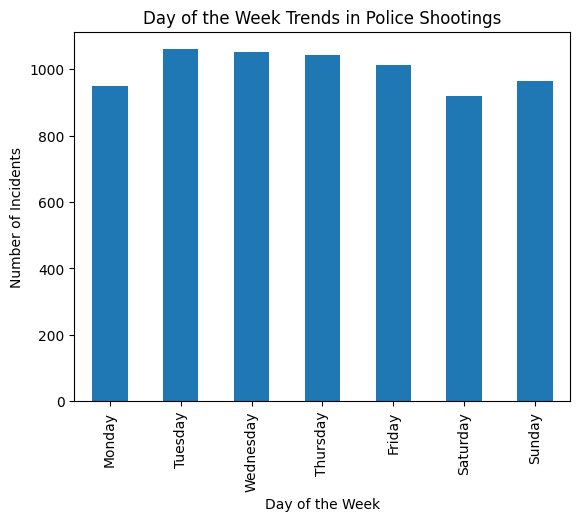

In [42]:
# Group by day of the week
weekday_data = df.groupby(df['date'].dt.dayofweek).size()

# Rename index to day names
weekday_data.index = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Plot the data
weekday_data.plot(kind='bar', title='Day of the Week Trends in Police Shootings')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Incidents')
plt.show()

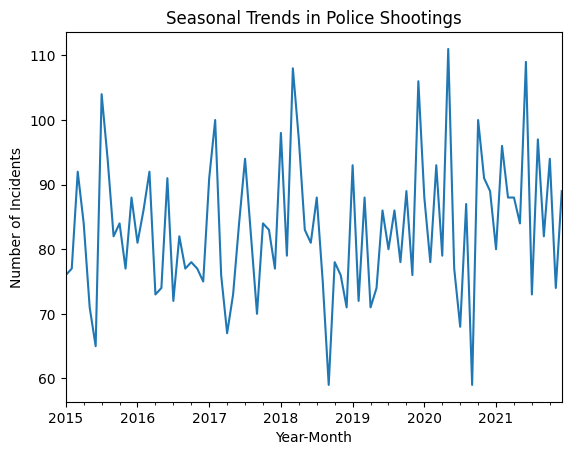

In [43]:
# Extract month and year for seasonal analysis
df['year_month'] = df['date'].dt.to_period('M')

# Group by year-month
seasonal_data = df.groupby('year_month').size()

# Plot the data
seasonal_data.plot(kind='line', title='Seasonal Trends in Police Shootings')
plt.xlabel('Year-Month')
plt.ylabel('Number of Incidents')
plt.show()

In [44]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [45]:
df.head()

,id,name,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,is_geocoding_exact,Age_group_of_the_Person,year_month
0,1,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,Shelton,WA,True,attack,Not fleeing,False,-123.122,47.247,True,Age between 40 and 60,2015-01
1,2,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,Aloha,OR,False,attack,Not fleeing,False,-122.892,45.487,True,Age between 40 and 60,2015-01
2,3,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,Wichita,KS,False,other,Not fleeing,False,-97.281,37.695,True,Age between 18 and 40,2015-01
3,4,Matthew Hoffman,2015-01-04,shot,toy weapon,32.0,M,W,San Francisco,CA,True,attack,Not fleeing,False,-122.422,37.763,True,Age between 18 and 40,2015-01
4,5,Michael Rodriguez,2015-01-04,shot,nail gun,39.0,M,H,Evans,CO,False,attack,Not fleeing,False,-104.692,40.384,True,Age between 18 and 40,2015-01


In [46]:
df.columns

Index(['id', 'name', 'date', 'manner_of_death', 'armed', 'age', 'gender',
       'race', 'city', 'state', 'signs_of_mental_illness', 'threat_level',
       'flee', 'body_camera', 'longitude', 'latitude', 'is_geocoding_exact',
       'Age_group_of_the_Person', 'year_month'],
      dtype='object')

In [47]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline

df['year'] = df['date'].dt.year

# Aggregate data by year to count the number of incidents per year
annual_incidents = df.groupby('year').size().reset_index(name='incident_count')

In [48]:
# Define features (X) and target (y)
X = annual_incidents[annual_incidents['year'] < 2022][['year']]
y = annual_incidents[annual_incidents['year'] < 2022]['incident_count']

In [49]:
y.head()

0    994
1    958
2    981
3    993
4    999
Name: incident_count, dtype: int64

In [50]:
# Split the data into training and test sets excluding 2022
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize a dictionary to store models and their performance metrics
model_performance = {}

# List of regression models to evaluate
models = {
    'Linear Regression': LinearRegression(),
    'Ridge Regression': Ridge(),
    'Lasso Regression': Lasso(),
    'Support Vector Regression': SVR(),
    'Decision Tree Regression': DecisionTreeRegressor(),
    'Random Forest Regression': RandomForestRegressor(),
    'Gradient Boosting Regression': GradientBoostingRegressor(),
    'Polynomial Regression (Degree 2)': make_pipeline(PolynomialFeatures(degree=2), LinearRegression()),
    'Polynomial Regression (Degree 3)': make_pipeline(PolynomialFeatures(degree=3), LinearRegression()),
}

# Evaluate each model using cross-validation and calculate performance metrics
for model_name, model in models.items():
    # Cross-validation
    cv_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
    cv_score_mean = -cv_scores.mean()

    # Fit model to training data
    model.fit(X_train, y_train)

    # Predict on test data
    y_pred = model.predict(X_test)

    # Calculate performance metrics
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    # Store metrics in the dictionary
    model_performance[model_name] = {
        'Cross-Validation Mean MSE': cv_score_mean,
        'Test MSE': mse,
        'Test MAE': mae,
        'Test R^2': r2,
    }

# Output the performance metrics for each model
for model_name, metrics in model_performance.items():
    print(f"{model_name} performance:")
    for metric_name, metric_value in metrics.items():
        print(f"   {metric_name}: {metric_value:.4f}")
    print()  # for better readability

# Identify the best model based on Cross-Validation Mean MSE
best_model_name = min(model_performance, key=lambda k: model_performance[k]['Cross-Validation Mean MSE'])
print(f"Best model based on CV Mean MSE: {best_model_name}")

Linear Regression performance:
   Cross-Validation Mean MSE: 225.5031
   Test MSE: 1447.3450
   Test MAE: 27.1500
   Test R^2: -3.4671

Ridge Regression performance:
   Cross-Validation Mean MSE: 235.7399
   Test MSE: 1137.4534
   Test MAE: 25.8636
   Test R^2: -2.5107

Lasso Regression performance:
   Cross-Validation Mean MSE: 232.3520
   Test MSE: 1342.1200
   Test MAE: 26.4000
   Test R^2: -3.1423

Support Vector Regression performance:
   Cross-Validation Mean MSE: 977.4551
   Test MSE: 822.1509
   Test MAE: 22.5560
   Test R^2: -1.5375

Decision Tree Regression performance:
   Cross-Validation Mean MSE: 384.2000
   Test MSE: 349.0000
   Test MAE: 18.0000
   Test R^2: -0.0772

Random Forest Regression performance:
   Cross-Validation Mean MSE: 387.7092
   Test MSE: 405.3604
   Test MAE: 18.0000
   Test R^2: -0.2511

Gradient Boosting Regression performance:
   Cross-Validation Mean MSE: 384.2038
   Test MSE: 349.0075
   Test MAE: 18.0000
   Test R^2: -0.0772

Polynomial Regression

In [51]:
best_model = models[best_model_name]
best_model.fit(X, y)

Pipeline(steps=[('polynomialfeatures', PolynomialFeatures()),
                ('linearregression', LinearRegression())])

In [52]:
prediction_input_2023 = pd.DataFrame([[2023]], columns=['year'])

prediction_2023 = best_model.predict(prediction_input_2023)

# The prediction_2023 variable now holds the estimated number of incidents for the year 2023
print(f"Predicted number of incidents for 2023: {prediction_2023[0]:.2f}")

Predicted number of incidents for 2023: 1139.36


In [53]:
prediction_input_2022 = pd.DataFrame([[2022]], columns=['year'])

prediction_2022 = best_model.predict(prediction_input_2022)

# The prediction_2023 variable now holds the estimated number of incidents for the year 2023
print(f"Predicted number of incidents for 2022: {prediction_2022[0]:.2f}")

Predicted number of incidents for 2022: 1092.71
